# Starcraft Player League - Prediction

### Goal: 
We are given a dataset of Starcraft player performance data in ranked games. We want to develop a model to predict a player’s rank using the information provided in the dataset.

In [1]:
# import needed libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

color_pal = sns.color_palette() 
plt.style.use('fivethirtyeight')
%matplotlib inline

In [2]:
# set print options to show all columns
pd.set_option('display.max_columns', 500)

# pd.set_option('display.width', 1000)
# pd.set_option('display.max_rows', 500)

In [3]:
# load the data
starcraft = pd.read_csv("starcraft_player_data.csv")

# create a copy data frame to work with
df = starcraft.copy()

## Exploratory Data Analysis

In [4]:
# get the data dimensions and size
print('Data Frame Shape:',df.shape)
print('Data Frame size:',df.size)

Data Frame Shape: (3395, 20)
Data Frame size: 67900


We are given a total of 3,395 observations and 20 attributes.

In [5]:
# check the column datatypes
df.dtypes

GameID                    int64
LeagueIndex               int64
Age                      object
HoursPerWeek             object
TotalHours               object
APM                     float64
SelectByHotkeys         float64
AssignToHotkeys         float64
UniqueHotkeys             int64
MinimapAttacks          float64
MinimapRightClicks      float64
NumberOfPACs            float64
GapBetweenPACs          float64
ActionLatency           float64
ActionsInPAC            float64
TotalMapExplored          int64
WorkersMade             float64
UniqueUnitsMade           int64
ComplexUnitsMade        float64
ComplexAbilitiesUsed    float64
dtype: object

Observe the attributes Age, HoursPerWeek, and TotalHours are object-data types when they are numeric columns. We must investigate these columns further. 

In [6]:
# check first 7 observations
df.head(7)

,GameID,LeagueIndex,Age,HoursPerWeek,TotalHours,APM,SelectByHotkeys,AssignToHotkeys,UniqueHotkeys,MinimapAttacks,MinimapRightClicks,NumberOfPACs,GapBetweenPACs,ActionLatency,ActionsInPAC,TotalMapExplored,WorkersMade,UniqueUnitsMade,ComplexUnitsMade,ComplexAbilitiesUsed
0,52,5,27,10,3000,143.7180,0.003515,0.000220,7,0.000110,0.000392,0.004849,32.6677,40.8673,4.7508,28,0.001397,6,0.0,0.000000
1,55,5,23,10,5000,129.2322,0.003304,0.000259,4,0.000294,0.000432,0.004307,32.9194,42.3454,4.8434,22,0.001193,5,0.0,0.000208
2,56,4,30,10,200,69.9612,0.001101,0.000336,4,0.000294,0.000461,0.002926,44.6475,75.3548,4.0430,22,0.000745,6,0.0,0.000189
3,57,3,19,20,400,107.6016,0.001034,0.000213,1,0.000053,0.000543,0.003783,29.2203,53.7352,4.9155,19,0.000426,7,0.0,0.000384
4,58,3,32,10,500,122.8908,0.001136,0.000327,2,0.000000,0.001329,0.002368,22.6885,62.0813,9.3740,15,0.001174,4,0.0,0.000019
5,60,2,27,6,70,44.4570,0.000978,0.000255,2,0.000000,0.000000,0.002425,76.4405,98.7719,3.0965,16,0.000372,6,0.0,0.000000
6,61,1,21,8,240,46.9962,0.000820,0.000169,6,0.000000,0.000045,0.001988,94.0227,90.5311,4.1017,15,0.000573,5,0.0,0.000000


In [7]:
# check the last 7 rows
df.tail(7)

,GameID,LeagueIndex,Age,HoursPerWeek,TotalHours,APM,SelectByHotkeys,AssignToHotkeys,UniqueHotkeys,MinimapAttacks,MinimapRightClicks,NumberOfPACs,GapBetweenPACs,ActionLatency,ActionsInPAC,TotalMapExplored,WorkersMade,UniqueUnitsMade,ComplexUnitsMade,ComplexAbilitiesUsed
3388,10083,8,?,?,?,288.7608,0.024022,0.000628,6,0.000350,0.001051,0.005580,19.0108,30.0866,5.3831,30,0.000761,5,0.000000,0.000652
3389,10084,8,?,?,?,151.4046,0.009732,0.000949,6,0.000028,0.000156,0.004363,27.4658,43.8052,4.3312,23,0.000949,6,0.000000,0.000099
3390,10089,8,?,?,?,259.6296,0.020425,0.000743,9,0.000621,0.000146,0.004555,18.6059,42.8342,6.2754,46,0.000877,5,0.000000,0.000000
3391,10090,8,?,?,?,314.6700,0.028043,0.001157,10,0.000246,0.001083,0.004259,14.3023,36.1156,7.1965,16,0.000788,4,0.000000,0.000000
3392,10092,8,?,?,?,299.4282,0.028341,0.000860,7,0.000338,0.000169,0.004439,12.4028,39.5156,6.3979,19,0.001260,4,0.000000,0.000000
3393,10094,8,?,?,?,375.8664,0.036436,0.000594,5,0.000204,0.000780,0.004346,11.6910,34.8547,7.9615,15,0.000613,6,0.000000,0.000631
3394,10095,8,?,?,?,348.3576,0.029855,0.000811,4,0.000224,0.001315,0.005566,20.0537,33.5142,6.3719,27,0.001566,7,0.000457,0.000895


In [8]:
# League Index classes count
df['LeagueIndex'].value_counts()

4    811
5    806
6    621
3    553
2    347
1    167
8     55
7     35
Name: LeagueIndex, dtype: int64

In [9]:
# shape of the data frame with league index 8 
df.loc[df['LeagueIndex'] == 8].shape

(55, 20)

In the columns Age, HoursPerWeek, and TotalHours we can see the last few values have '?' which represents null values. Also all those 55 observations with null values for the columns Age, HoursPerWeek, and TotalHours represent the only values of League Index classified as 8 (Professional). We are going to replace '?' with numpy nan values and consider how to handle these missing values. 

In [10]:
# replace ? with np.nan
df.replace(['?'], np.nan, inplace = True)

In [11]:
# data frame info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3395 entries, 0 to 3394
Data columns (total 20 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   GameID                3395 non-null   int64  
 1   LeagueIndex           3395 non-null   int64  
 2   Age                   3340 non-null   object 
 3   HoursPerWeek          3339 non-null   object 
 4   TotalHours            3338 non-null   object 
 5   APM                   3395 non-null   float64
 6   SelectByHotkeys       3395 non-null   float64
 7   AssignToHotkeys       3395 non-null   float64
 8   UniqueHotkeys         3395 non-null   int64  
 9   MinimapAttacks        3395 non-null   float64
 10  MinimapRightClicks    3395 non-null   float64
 11  NumberOfPACs          3395 non-null   float64
 12  GapBetweenPACs        3395 non-null   float64
 13  ActionLatency         3395 non-null   float64
 14  ActionsInPAC          3395 non-null   float64
 15  TotalMapExplored     

In [12]:
# check how many missing values for each column
df.isna().sum()

GameID                   0
LeagueIndex              0
Age                     55
HoursPerWeek            56
TotalHours              57
APM                      0
SelectByHotkeys          0
AssignToHotkeys          0
UniqueHotkeys            0
MinimapAttacks           0
MinimapRightClicks       0
NumberOfPACs             0
GapBetweenPACs           0
ActionLatency            0
ActionsInPAC             0
TotalMapExplored         0
WorkersMade              0
UniqueUnitsMade          0
ComplexUnitsMade         0
ComplexAbilitiesUsed     0
dtype: int64

We have to consider how we are going to handle the missing values in this data frame since it will cause issues during our modeling phase. Now there are several approaches to handle our missing values, we can drop the observations or we can use different methods of imputing values such as using the mean, median, or even using a machine learning algorithm such as KNN Imputer or Iterative Imputer. Now we cannot drop the rows with missing values since we will be losing valuable information on League Index - 8. Therefore we will impute these null values in our preprocessing phase. 

In [13]:
# check for duplicates
df.duplicated().sum()

0

In [14]:
# feature selection 
df1 = df.drop('GameID', axis = 1)

Now we drop the columns that will not provided any information in predicting the League Index therefore we can drop GameID since it will not help our model detect a pattern. 

In [15]:
# statistical summary
df1.describe().T

,count,mean,std,min,25%,50%,75%,max
LeagueIndex,3395.0,4.184094,1.517327,1.000000,3.000000,4.000000,5.000000,8.000000
APM,3395.0,117.046947,51.945291,22.059600,79.900200,108.010200,142.790400,389.831400
SelectByHotkeys,3395.0,0.004299,0.005284,0.000000,0.001258,0.002500,0.005133,0.043088
AssignToHotkeys,3395.0,0.000374,0.000225,0.000000,0.000204,0.000353,0.000499,0.001752
UniqueHotkeys,3395.0,4.364654,2.360333,0.000000,3.000000,4.000000,6.000000,10.000000
MinimapAttacks,3395.0,0.000098,0.000166,0.000000,0.000000,0.000040,0.000119,0.003019
MinimapRightClicks,3395.0,0.000387,0.000377,0.000000,0.000140,0.000281,0.000514,0.004041
NumberOfPACs,3395.0,0.003463,0.000992,0.000679,0.002754,0.003395,0.004027,0.007971
GapBetweenPACs,3395.0,40.361562,17.153570,6.666700,28.957750,36.723500,48.290500,237.142900
ActionLatency,3395.0,63.739403,19.238869,24.093600,50.446600,60.931800,73.681300,176.372100


Here we can check for any outliers by checking the mean of each column and the standard deviation of each column. If the minimum or maximum of each column is greater than or less than $\mu \pm 3\sigma$ than it is most likely an outlier or an error and should be investigated further. 

## Visualizations 

### Univariate Analysis

In [16]:
# change our column data types into int
df1[['Age', 'HoursPerWeek', 'TotalHours']] = df1[['Age', 'HoursPerWeek', 'TotalHours']].astype(float)
df1.dtypes

LeagueIndex               int64
Age                     float64
HoursPerWeek            float64
TotalHours              float64
APM                     float64
SelectByHotkeys         float64
AssignToHotkeys         float64
UniqueHotkeys             int64
MinimapAttacks          float64
MinimapRightClicks      float64
NumberOfPACs            float64
GapBetweenPACs          float64
ActionLatency           float64
ActionsInPAC            float64
TotalMapExplored          int64
WorkersMade             float64
UniqueUnitsMade           int64
ComplexUnitsMade        float64
ComplexAbilitiesUsed    float64
dtype: object

For the meantime we will classify our object data type columns as floats to make our visualizations more appealing. Note: we actually want these columns to be INT data type, however, int cannot handle nan values therefore as a substitution we will use float.

In [17]:
# League Index Classes 1-8
classes = ['Bronze', 'Silver', 'Gold', 'Platinum', 'Diamond', 'Master',
'GrandMaster', 'Professional']

In [18]:
# check the count for each class in our categorical variable
df1['LeagueIndex'].value_counts()

4    811
5    806
6    621
3    553
2    347
1    167
8     55
7     35
Name: LeagueIndex, dtype: int64

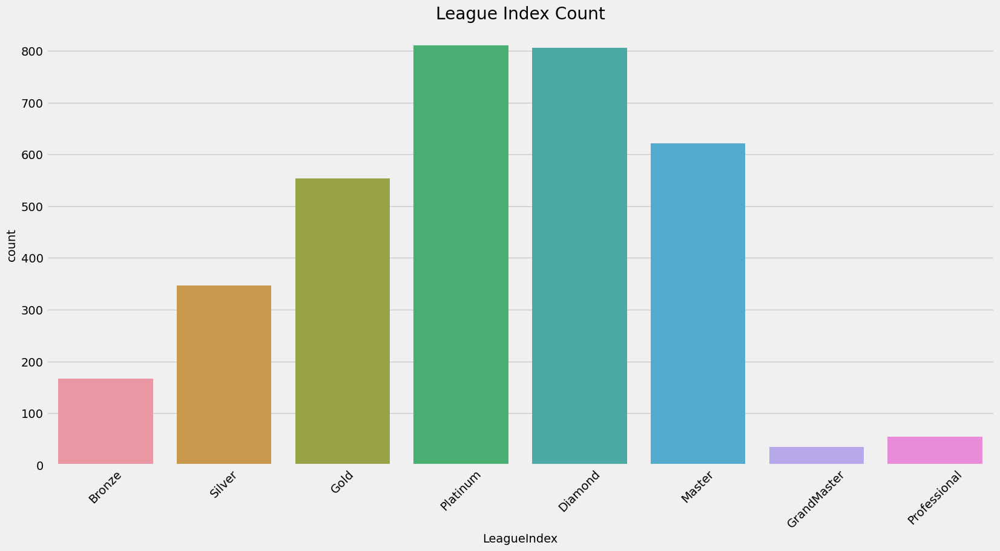

In [19]:
# bar chart on LeagueIndex
plt.figure(figsize = (18,9))
sns.countplot(data = df1, x = 'LeagueIndex')
plt.title('League Index Count')
plt.xticks(ticks = list(range(0,8)), labels = classes, rotation = 45)
plt.show()

Here we can see the distribution of classes for our target variable League Index. We can see that we have unbalanced classes in our target variable where a majority of classes in our data set represent Gold, Platinum, Diamond, and Master Leagues. Now for our modeling phase our algorithms may have trouble learning the classes with few observations such as Grandmaster and Professional. We have to be careful on how we split our data into training and testing sets since we want our algroithm to learn these classes. 

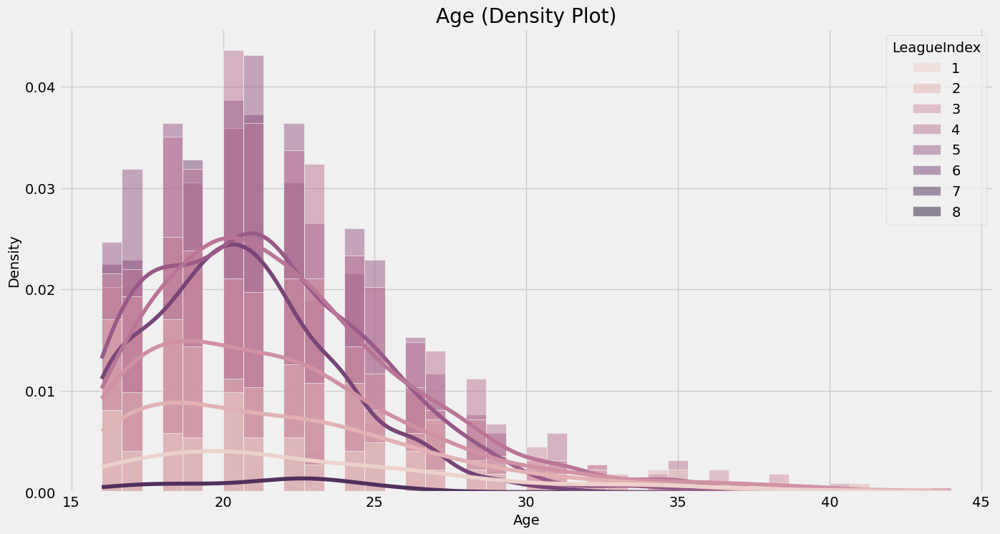

In [20]:
plt.figure(figsize = (15,8))
sns.histplot(data = df1, 
             x = 'Age', 
             stat = 'density', 
             kde = True, 
             hue = 'LeagueIndex',
             color = color_pal[2])
plt.title('Age (Density Plot)')
plt.show()

The histogram on the Age attribute showcase that a majority of the players in the game are between 16 and 30 years old. Also recall Age is a column with missing values, since we want to impute these values based on the histogram above it may be better to impute the data using median rather than the mean since we do not have a normal distribution. 

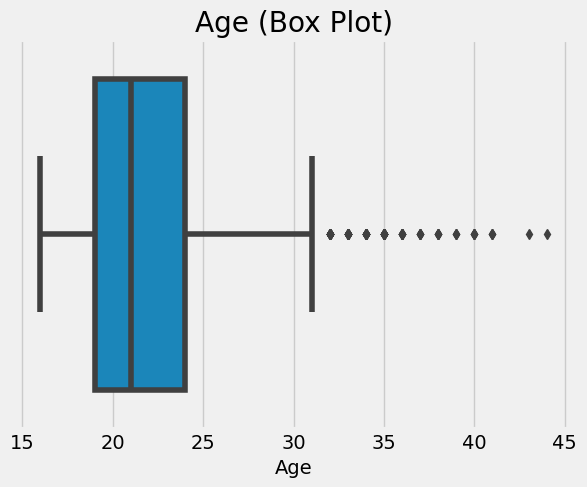

In [21]:
# Box Plot on Age
sns.boxplot(data = df1, x = 'Age')
plt.title('Age (Box Plot)')
plt.show()

The box plot on Age showcases the points greater the 3rd quartile which can reprepresent potential outliers which can skew our results. 

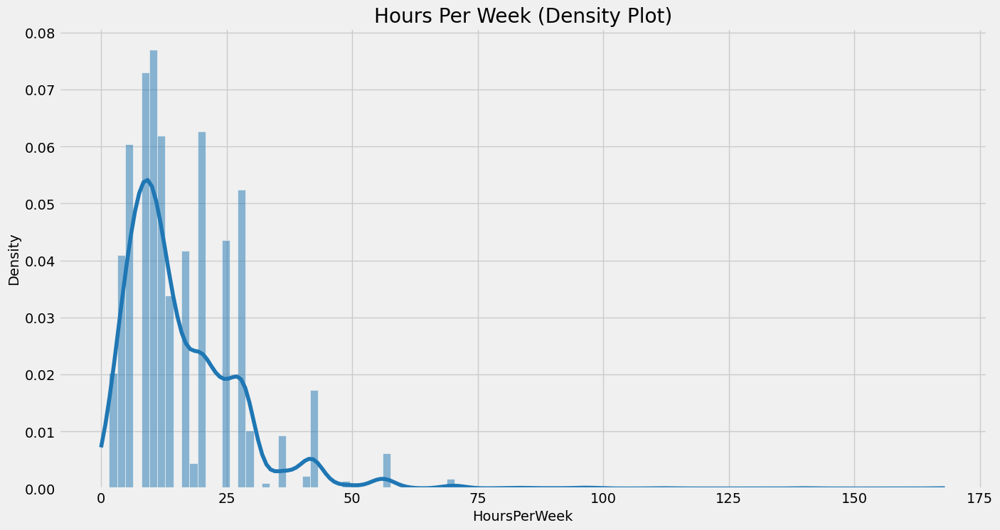

In [22]:
plt.figure(figsize = (15,8))
sns.histplot(data = df1, 
             x = 'HoursPerWeek', 
             stat = 'density', 
             kde = True, 
             color = color_pal[0])
plt.title('Hours Per Week (Density Plot)')
plt.show()

The histogram on Hours Per Week is also skewed to the right therefore imputing using the median or mode might repesent the data better than the mean. We can also see that the majority of the players play between 1 and 50 hours per week. 

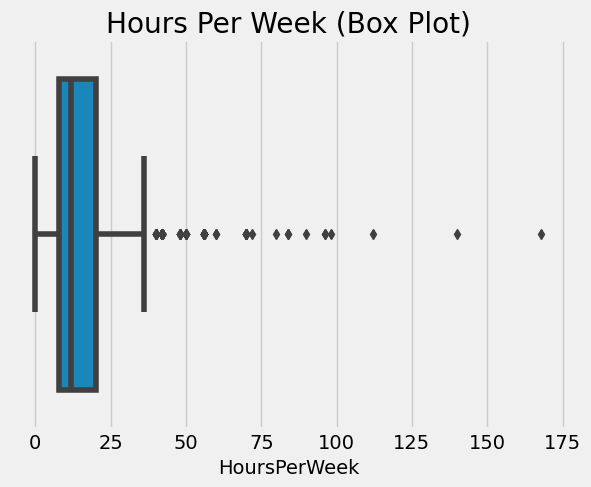

In [23]:
# Box Plot on Hours Per Week
sns.boxplot(data = df1, x = 'HoursPerWeek')
plt.title('Hours Per Week (Box Plot)')
plt.show()

We also see some points far to the right of the box which are huge indicators of outlier pontential.

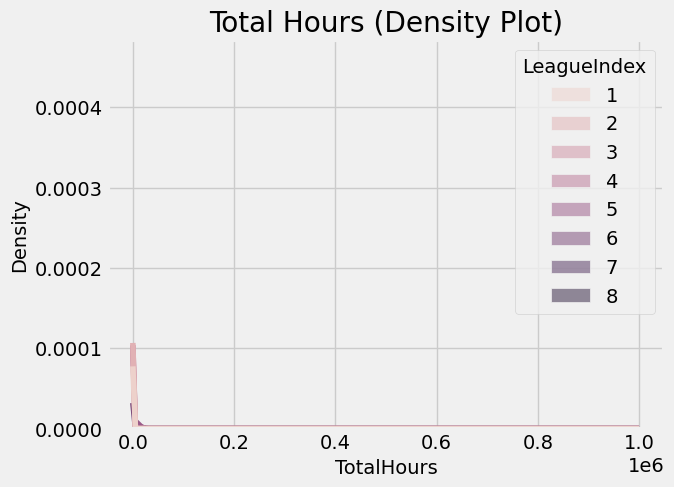

In [24]:
sns.histplot(data = df1, x = 'TotalHours', stat = 'density', kde = True, hue = 'LeagueIndex')
plt.title('Total Hours (Density Plot)')
plt.show()

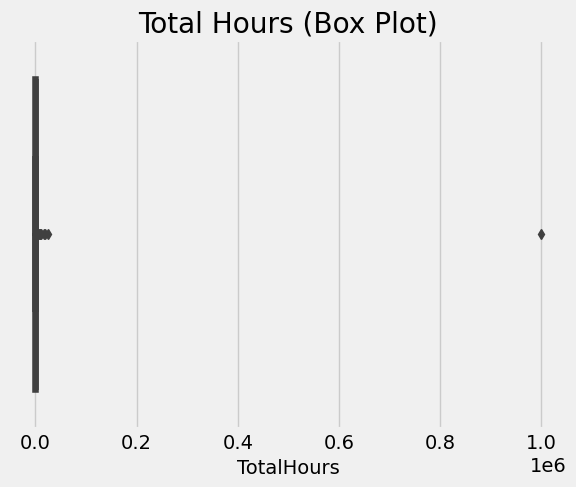

In [25]:
# Box Plot on Every Column except Total Hours
sns.boxplot(data = df1, x = 'TotalHours')
plt.title('Total Hours (Box Plot)')
plt.show()

For our Total Hours attribute the box plot above showcases an extreme outlier. Where a player played about a 1 million hours in total. This may be an error however we mst drop this outlier or it may skew our results for our modeling phase.

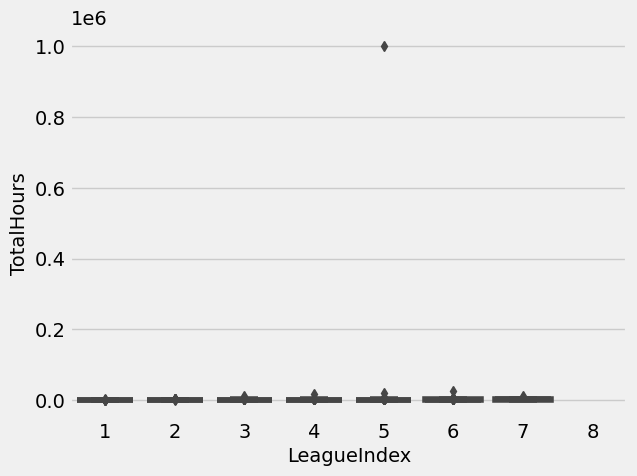

In [26]:
# Box Plot on Total Hours seperated by League Index
sns.boxplot(data = df1, x = 'LeagueIndex', y = 'TotalHours')
plt.show()

The extreme outlier that we saw in the Total Hours is classified under the league index - 5.

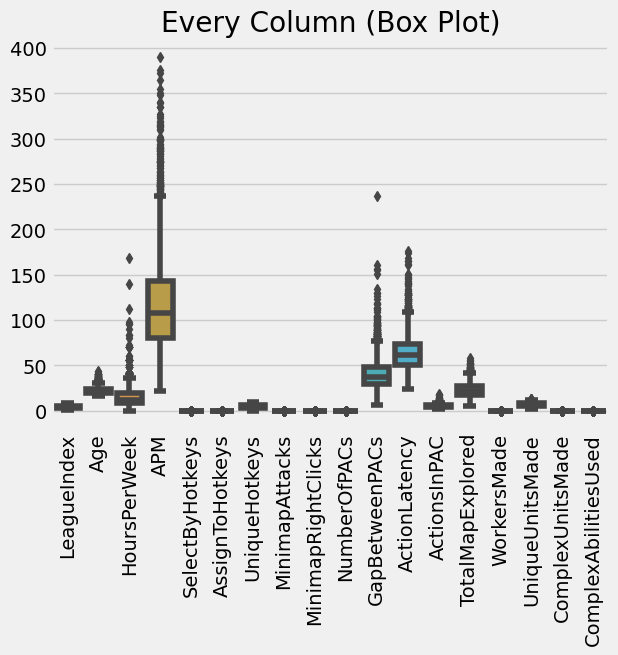

In [27]:
# Box Plot on Every Column except Total Hours
sns.boxplot(df1.drop('TotalHours', axis = 1))
plt.title('Every Column (Box Plot)')
plt.xticks(rotation = 90)
plt.show()

Here we can see pontential outliers for our other columns. 

### Bivariate and Multivariate Analysis 

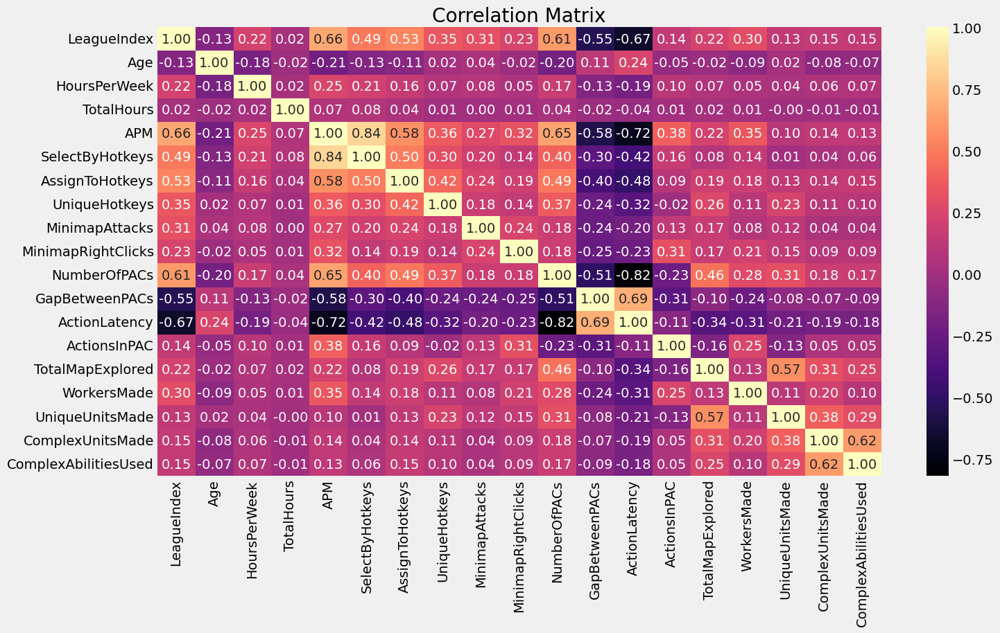

In [28]:
# correlation matrix 
# check the correlation between two variables 
# want to see what features are highly correlated with our target variable

corr = df1.corr()
plt.figure(figsize = (15,8))
sns.heatmap(corr, fmt = '.2f', annot = True, cmap = 'magma', linecolor = 'white')
plt.title("Correlation Matrix")
plt.show()

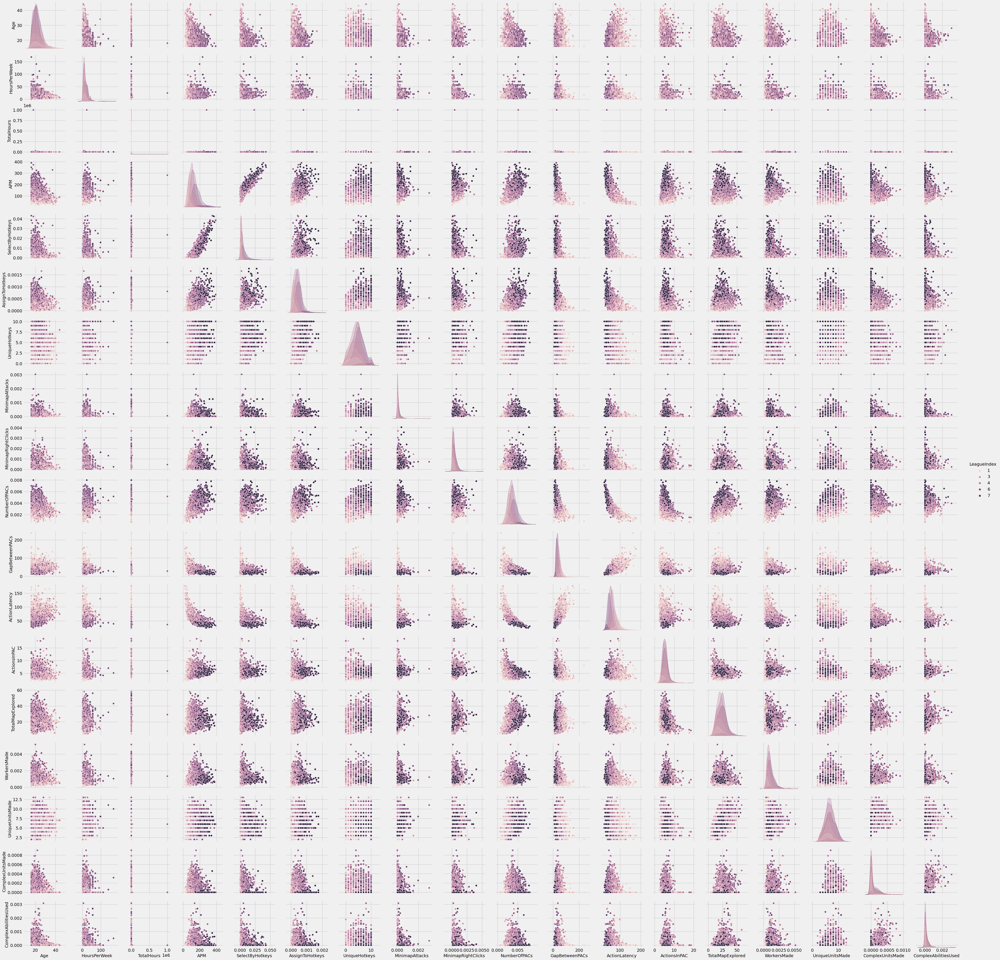

In [29]:
# pair plot
sns.pairplot(data = df1, hue = 'LeagueIndex')
plt.show()

## Preprocessing

In [30]:
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer

In [31]:
df1.columns

Index(['LeagueIndex', 'Age', 'HoursPerWeek', 'TotalHours', 'APM',
       'SelectByHotkeys', 'AssignToHotkeys', 'UniqueHotkeys', 'MinimapAttacks',
       'MinimapRightClicks', 'NumberOfPACs', 'GapBetweenPACs', 'ActionLatency',
       'ActionsInPAC', 'TotalMapExplored', 'WorkersMade', 'UniqueUnitsMade',
       'ComplexUnitsMade', 'ComplexAbilitiesUsed'],
      dtype='object')

In [32]:
# first we seperate our target variable from our predictors

# Our predictors 
X = df1.drop('LeagueIndex', axis = 1)

# Our target variable
y = df1['LeagueIndex']

In [33]:
# We conduct a 75/25 split for our train and test
X_train, X_test, y_train, y_test = train_test_split(X,y,
                                                    test_size = 0.25, 
                                                    stratify = y, 
                                                    random_state = 42)

Here we perform a train/test split of 75 and 25 percent, respectively and note we have an additional argument called stratify. Now we stratify our y since if you recall our target categorical variable had imbalanced classes. The stratify argument will ensure our training and testing set contains information on all classes so that our model can learn from all classes.

In [34]:
# class distribution for our train
y_train.value_counts()

4    608
5    605
6    466
3    415
2    260
1    125
8     41
7     26
Name: LeagueIndex, dtype: int64

In [35]:
# class distribution for our test
y_test.value_counts()

4    203
5    201
6    155
3    138
2     87
1     42
8     14
7      9
Name: LeagueIndex, dtype: int64

In [36]:
# train and test sets shape for our predictors
X_train.shape, X_test.shape

((2546, 18), (849, 18))

In [37]:
# first 5 observations for our train
X_train.head()

,Age,HoursPerWeek,TotalHours,APM,SelectByHotkeys,AssignToHotkeys,UniqueHotkeys,MinimapAttacks,MinimapRightClicks,NumberOfPACs,GapBetweenPACs,ActionLatency,ActionsInPAC,TotalMapExplored,WorkersMade,UniqueUnitsMade,ComplexUnitsMade,ComplexAbilitiesUsed
560,17.0,28.0,450.0,141.6522,0.002045,0.000543,6,0.000000,0.000703,0.003025,31.4629,64.1972,8.3310,21,0.002216,7,0.000000,0.000032
2511,20.0,20.0,1440.0,190.5402,0.012627,0.001145,4,0.000506,0.000738,0.003327,23.5600,50.7232,7.0873,25,0.000730,6,0.000133,0.000041
1028,19.0,12.0,800.0,149.9052,0.003989,0.000384,2,0.000048,0.000300,0.004878,41.5210,43.9310,4.6847,23,0.001406,6,0.000204,0.000120
1401,25.0,20.0,700.0,95.5704,0.001895,0.000332,5,0.000462,0.000166,0.003221,35.3358,63.3088,5.1618,19,0.000734,5,0.000332,0.000509
2879,17.0,8.0,800.0,119.8326,0.003110,0.000123,3,0.000000,0.000108,0.003819,24.5182,52.6613,5.2218,20,0.001632,5,0.000385,0.000462


In [38]:
# check for missing values for our train
X_train.isna().sum()

Age                     41
HoursPerWeek            42
TotalHours              43
APM                      0
SelectByHotkeys          0
AssignToHotkeys          0
UniqueHotkeys            0
MinimapAttacks           0
MinimapRightClicks       0
NumberOfPACs             0
GapBetweenPACs           0
ActionLatency            0
ActionsInPAC             0
TotalMapExplored         0
WorkersMade              0
UniqueUnitsMade          0
ComplexUnitsMade         0
ComplexAbilitiesUsed     0
dtype: int64

### Prepare our X_train for modeling

Now we want to perform the preprocessing steps onto our X_train and not perform the preprocessing phase on the entire data set. The reason we don't want to perform the entire preprocessing phase on the entire data set is that it might cause data leakage, outside information that may influence our model, since our model is to be used for unseen data we do not want data leakage. 

In [39]:
# Function for outlier removal using Interquartile Range

def outlier_removal(df):
    q3, q1 = np.percentile(df, [75, 25])
    IQR = q3 - q1

    upper_bound = q3 + 1.5 * IQR
    lower_bound = q1 - 1.5 * IQR
    
    df = df.loc[df < upper_bound]
    df = df.loc[df > lower_bound]
    return df

In [40]:
# preprocessing function
imputer = SimpleImputer(missing_values = np.nan, strategy = 'median')
scaler = StandardScaler()
le = LabelEncoder()

def preprocess(X,y):
    # first impute any missing data
    X[['Age','HoursPerWeek','TotalHours']] = imputer.fit_transform(X[['Age','HoursPerWeek','TotalHours']])
    
    # remove any outliers in Total Hours
    merge_set = pd.concat([X, y], axis = 1)
    merge_set['TotalHours'] = outlier_removal(merge_set['TotalHours'])
    merge_set.dropna(axis = 0, inplace = True)
    
    # split merged data frame
    X_train = merge_set.drop('LeagueIndex', axis = 1)
    y_train = merge_set['LeagueIndex']
    
    # convert float dtype into int
    X_train[['Age','HoursPerWeek','TotalHours']] = X_train[['Age','HoursPerWeek','TotalHours']].astype(int)
    
    scale = ['APM', 'SelectByHotkeys', 'AssignToHotkeys', 'MinimapAttacks', 'MinimapRightClicks',
         'NumberOfPACs', 'GapBetweenPACs', 'ActionLatency', 'ActionsInPAC', 'WorkersMade',
         'ComplexUnitsMade', 'ComplexAbilitiesUsed']
    # normalize our data
    # turn numpy matrix into dataframe to keep column names
    X_train[scale] = scaler.fit_transform(X_train[scale])
    
    y_train = le.fit_transform(y_train)
    
    return X_train, y_train

In [41]:
# preprocess our training and testing sets
X_train, y_train = preprocess(X_train, y_train)
X_test, y_test = preprocess(X_test, y_test)

## Modeling

In [42]:
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, mean_squared_error

Now we are in the modeling phase, where now we have to consider what type of metrics will be best suited for our particular problem. Now our target variable is a categorical variable where we have a total of 8 classes. Since this is a classification problem some metrics that we can use are, missclassification error rate, accuracy, mean squared error, auc, or root mean squared error. Note: there are many other metrics available. Now I will be using 2 different metrics through out which are the accuracy score and root mean squared error.  

### Random Forest Classifier

In [43]:
# instantiate our model
rfc = RandomForestClassifier(n_estimators=100,
    criterion='gini',
    max_depth=None,
    min_samples_split=2,
    min_samples_leaf=1,
    min_weight_fraction_leaf=0.0,
    max_features='sqrt',
    max_leaf_nodes=None,
    min_impurity_decrease=0.0,
    bootstrap=True,
    oob_score=False,
    n_jobs=None,
    random_state=0,
    verbose=0,
    warm_start=False,
    class_weight=None,
    ccp_alpha=0.0,
    max_samples=None)

# fitting our model
rfc.fit(X_train,y_train)

RandomForestClassifier(random_state=0)

In [44]:
# numpy array representing feature importance for each column
rfc.feature_importances_

array([0.04189121, 0.04121081, 0.0696165 , 0.08638902, 0.0753747 ,
       0.06479497, 0.03515948, 0.05503491, 0.05363676, 0.07142977,
       0.06869699, 0.09383116, 0.05422139, 0.04490323, 0.05752553,
       0.03107266, 0.02106192, 0.03414898])

In [45]:
# placing our feature importance in a dataframe
fi = pd.DataFrame(data = rfc.feature_importances_, index = rfc.feature_names_in_,
            columns = ['importance'])

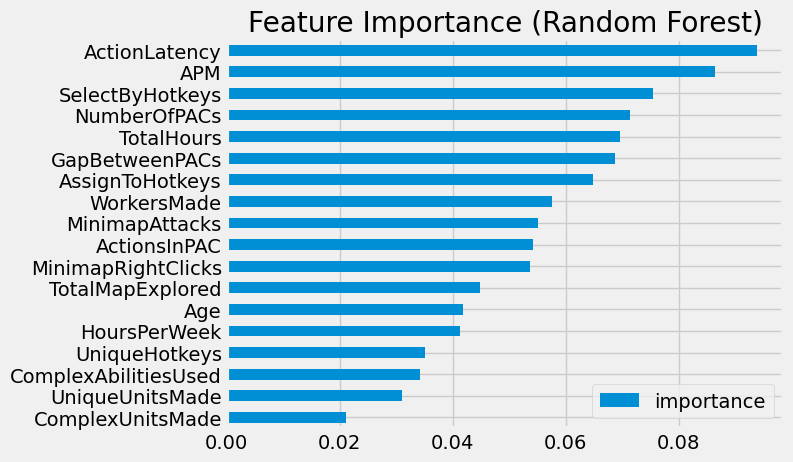

In [46]:
# plot feature importance
fi.sort_values('importance').plot(kind = 'barh', title = 'Feature Importance (Random Forest)')
plt.show()

In [47]:
# use model to predict on unseen data
y_pred = rfc.predict(X_test)

In [48]:
# metrics
print(f'Accuracy score: {accuracy_score(y_test, y_pred)}')
print('RMSE is:', mean_squared_error(y_test, y_pred, squared = False))

Accuracy score: 0.4230769230769231
RMSE is: 1.018440397702515


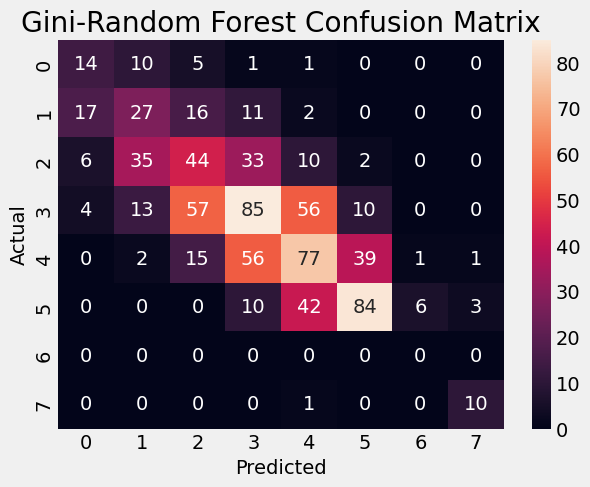

In [49]:
# Random Forest Confusion Matrix
cm = confusion_matrix(y_pred, y_test)
sns.heatmap(cm, annot=True, fmt="d")
plt.title('Gini-Random Forest Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

### XG Boost Classifier

In [50]:
# instantiate our model
boost = xgb.XGBClassifier(n_estimators = 1500, early_stopping_rounds = 50, learning_rate = 0.0009,
                        random_state = 0, eval_metric = 'merror',num_class = 8,
                         objective = 'multi:softmax')

In [51]:
# fit our model
boost.fit(X_train, y_train, 
        eval_set = [(X_train, y_train),(X_test, y_test)],
        verbose = 100)

[0]	validation_0-merror:0.43512	validation_1-merror:0.61663
[51]	validation_0-merror:0.41446	validation_1-merror:0.61166


XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=50,
              enable_categorical=False, eval_metric='merror',
              feature_types=None, gamma=None, gpu_id=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=0.0009, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, n_estimators=1500, n_jobs=None,
              num_class=8, num_parallel_tree=None, objective='multi:softmax', ...)

In [52]:
# using xgboost to predict on unseen data
y_pred = boost.predict(X_test)

In [53]:
# metrics
print(f'Accuracy: {accuracy_score(y_test, y_pred)}')
print('RMSE is:', mean_squared_error(y_test, y_pred, squared = False))

Accuracy: 0.3920595533498759
RMSE is: 1.1861483426700299


In [54]:
# placing our column importance in a dataframe
fi = pd.DataFrame(data = boost.feature_importances_, index = boost.feature_names_in_,
            columns = ['importance'])

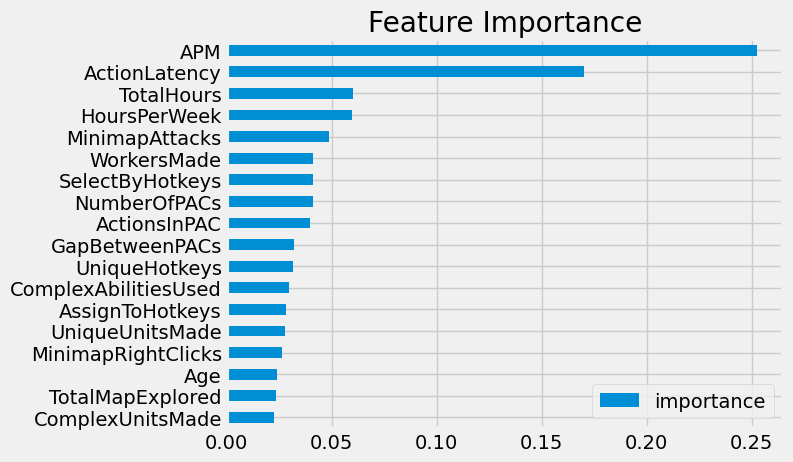

In [55]:
# plot which features were importance in the model as a bundle
fi.sort_values('importance').plot( kind = 'barh', title = 'Feature Importance')
plt.show()

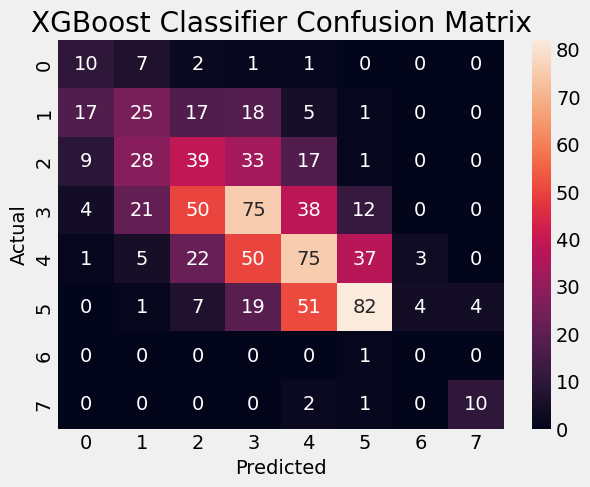

In [56]:
# Random Forest Confusion Matrix
cm = confusion_matrix(y_pred, y_test)
sns.heatmap(cm, annot=True, fmt="d")
plt.title('XGBoost Classifier Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

## Conclusion

Note: for both models Random Forest and XGBoost, we did not perform any hyperparameter tuning where we could have used gridsearchcv or randomizedsearchcv from sklearn to find the optimal paramters. Finding the optimal parameters can help us improve our metric scores. Also we did not perform any cross validation on our training and testing sets to check the validity of our model on unseen data. We also did not perform any feature selection to check if the model metric scores improve. 

Hypothetical: after seeing your work, your stakeholders come to you and say that they
can collect more data, but want your guidance before starting. How would you advise
them based on your EDA and model results?

### Communication to our StakeHolders:
Since Random Forest Classifier returned the highest score in terms of accuracy and had the lowest root mean squared error, we will consider this model. Now the accuracy for our Random Forest Classifier model was a 42% accuracy score, which isn't that great in predicting our rank for our players. Now using the feature importance for our Random Forest, we saw that the top 6 attributes that influence a players rank are ActionLatency, APM, SelectByHotkeys, NumberOfPACs, TotalHours, and GapBetweenPACs. If my stakeholders come to me and say that they can collect more data for our project, I would tell them instead of collecting data from all 18 predictors which were used for our model, I would choose only the top important features since these are the attributes that influence a players rank as a majority. We can choose the top 6 attributes or 10 which is still less than 18 attributes. This would reduce cost and time for the company when collecting this data. We also would want to have more data from the classes of our rank that had few observations, for example grandmaster and professional players, since our model wasn't learning them too well. Having more of this data can help improve our model and help predict a players rank more accurately.  